In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 
import sklearn 
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

['sample_submision.csv', 'indian_liver_patient_train.csv', 'indian_liver_patient_test.csv']


In [2]:
path = '../input/indian_liver_patient_train.csv'
df = pd.read_csv(path)
df.fillna(0)
df.head()

,ID,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Category
0,0,65,Female,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,1,62,Male,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,2,62,Male,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,3,58,Male,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,5,46,Male,1.8,0.7,208,19,14,7.6,4.4,1.30,1


In [3]:
from sklearn import preprocessing 
le = preprocessing.LabelEncoder()
df.Gender = le.fit_transform(df.Gender)
df.head()

,ID,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Category
0,0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,5,46,1,1.8,0.7,208,19,14,7.6,4.4,1.30,1


In [4]:
df.columns

Index(['ID', 'Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'Category'],
      dtype='object')

In [5]:
col = ['Age', 'Gender', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio', 'Category']
newdf = df[col]
newdf.head()

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Category
0,65,0,0.7,0.1,187,16,18,6.8,3.3,0.90,1
1,62,1,10.9,5.5,699,64,100,7.5,3.2,0.74,1
2,62,1,7.3,4.1,490,60,68,7.0,3.3,0.89,1
3,58,1,1.0,0.4,182,14,20,6.8,3.4,1.00,1
4,46,1,1.8,0.7,208,19,14,7.6,4.4,1.30,1


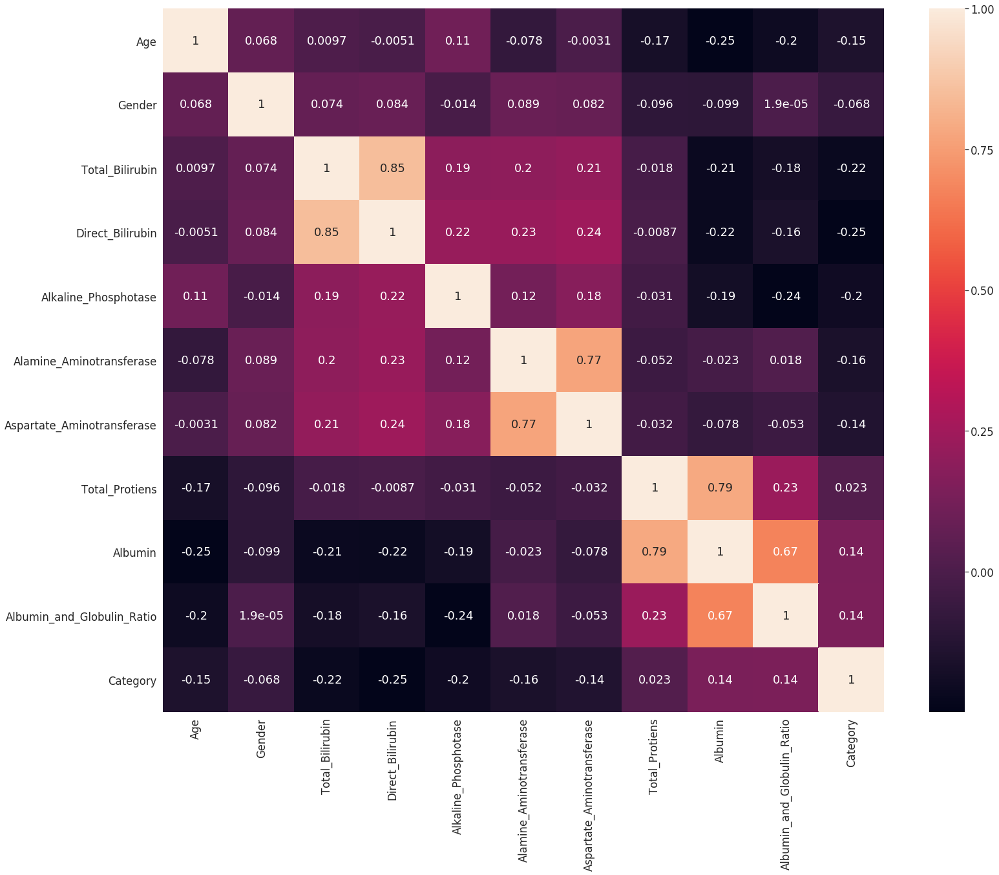

In [6]:
# corrilation plot 
import seaborn as sns 
import matplotlib.pyplot as plt
plt.figure(figsize=(25,20))
sns.set(font_scale=1.5)
sns.heatmap(newdf.corr(),annot=True);

In [7]:
# let us use imputation for blank rows
from sklearn.impute import SimpleImputer
myimputer = SimpleImputer()
train = myimputer.fit_transform(newdf)
df = pd.DataFrame(myimputer.fit_transform(newdf))
df.columns = newdf.columns

In [8]:
df.head()

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio,Category
0,65.0,0.0,0.7,0.1,187.0,16.0,18.0,6.8,3.3,0.90,1.0
1,62.0,1.0,10.9,5.5,699.0,64.0,100.0,7.5,3.2,0.74,1.0
2,62.0,1.0,7.3,4.1,490.0,60.0,68.0,7.0,3.3,0.89,1.0
3,58.0,1.0,1.0,0.4,182.0,14.0,20.0,6.8,3.4,1.00,1.0
4,46.0,1.0,1.8,0.7,208.0,19.0,14.0,7.6,4.4,1.30,1.0


In [9]:
col = ['Age', 'Gender','Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio']
train_X = df[col]
train_Y = df['Category']
train_X.head()

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,65.0,0.0,0.7,0.1,187.0,16.0,18.0,6.8,3.3,0.90
1,62.0,1.0,10.9,5.5,699.0,64.0,100.0,7.5,3.2,0.74
2,62.0,1.0,7.3,4.1,490.0,60.0,68.0,7.0,3.3,0.89
3,58.0,1.0,1.0,0.4,182.0,14.0,20.0,6.8,3.4,1.00
4,46.0,1.0,1.8,0.7,208.0,19.0,14.0,7.6,4.4,1.30


In [10]:
print(len(train_X))
print(len(train_Y))

459
459


In [11]:
# import forest classifier here 
from sklearn.ensemble import RandomForestClassifier as rf 
model = rf()

In [12]:
# fit the model in 
model.fit(train_X,train_Y)

/opt/conda/lib/python3.6/site-packages/sklearn/ensemble/forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=None,
            oob_score=False, random_state=None, verbose=0,
            warm_start=False)

# let us check the accurarcy 

In [13]:
testpath = '../input/indian_liver_patient_test.csv'
tes = pd.read_csv(testpath)
col = ['ID', 'Gender','Age', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio']
test = tes[col]
test.head()
test.info()
test.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 124 entries, 0 to 123
Data columns (total 11 columns):
ID                            124 non-null int64
Gender                        124 non-null object
Age                           124 non-null int64
Total_Bilirubin               124 non-null float64
Direct_Bilirubin              124 non-null float64
Alkaline_Phosphotase          124 non-null int64
Alamine_Aminotransferase      124 non-null int64
Aspartate_Aminotransferase    124 non-null int64
Total_Protiens                124 non-null float64
Albumin                       124 non-null float64
Albumin_and_Globulin_Ratio    123 non-null float64
dtypes: float64(5), int64(5), object(1)
memory usage: 10.7+ KB


,ID,Gender,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,4,Male,72,3.9,2.0,195,27,59,7.3,2.4,0.4
1,49,Male,55,18.4,8.8,206,64,178,6.2,1.8,0.4
2,51,Female,34,0.6,0.1,161,15,19,6.6,3.4,1.0
3,104,Male,63,0.5,0.1,170,21,28,5.5,2.5,0.8
4,105,Male,36,5.3,2.3,145,32,92,5.1,2.6,1.0


In [14]:
# use label encoder to transform the gender into the number
test.Gender = le.fit_transform(test.Gender)
test.head()

,ID,Gender,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,4,1,72,3.9,2.0,195,27,59,7.3,2.4,0.4
1,49,1,55,18.4,8.8,206,64,178,6.2,1.8,0.4
2,51,0,34,0.6,0.1,161,15,19,6.6,3.4,1.0
3,104,1,63,0.5,0.1,170,21,28,5.5,2.5,0.8
4,105,1,36,5.3,2.3,145,32,92,5.1,2.6,1.0


In [15]:
# now use imputer to remove the nan and infinity values
#test1 = myimputer.fit_transform(test)
test2 = pd.DataFrame(myimputer.fit_transform(test))
test2.columns = test.columns
test2.head()

,ID,Gender,Age,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,4.0,1.0,72.0,3.9,2.0,195.0,27.0,59.0,7.3,2.4,0.4
1,49.0,1.0,55.0,18.4,8.8,206.0,64.0,178.0,6.2,1.8,0.4
2,51.0,0.0,34.0,0.6,0.1,161.0,15.0,19.0,6.6,3.4,1.0
3,104.0,1.0,63.0,0.5,0.1,170.0,21.0,28.0,5.5,2.5,0.8
4,105.0,1.0,36.0,5.3,2.3,145.0,32.0,92.0,5.1,2.6,1.0


In [16]:
test.columns 

Index(['ID', 'Gender', 'Age', 'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio'],
      dtype='object')

In [17]:
#test.head()
#test2.fillna(0)
col = ['Age','Gender' ,'Total_Bilirubin', 'Direct_Bilirubin',
       'Alkaline_Phosphotase', 'Alamine_Aminotransferase',
       'Aspartate_Aminotransferase', 'Total_Protiens', 'Albumin',
       'Albumin_and_Globulin_Ratio']
test_X = test2[col]
test_X.head()

,Age,Gender,Total_Bilirubin,Direct_Bilirubin,Alkaline_Phosphotase,Alamine_Aminotransferase,Aspartate_Aminotransferase,Total_Protiens,Albumin,Albumin_and_Globulin_Ratio
0,72.0,1.0,3.9,2.0,195.0,27.0,59.0,7.3,2.4,0.4
1,55.0,1.0,18.4,8.8,206.0,64.0,178.0,6.2,1.8,0.4
2,34.0,0.0,0.6,0.1,161.0,15.0,19.0,6.6,3.4,1.0
3,63.0,1.0,0.5,0.1,170.0,21.0,28.0,5.5,2.5,0.8
4,36.0,1.0,5.3,2.3,145.0,32.0,92.0,5.1,2.6,1.0


In [18]:
predict_y = model.predict(test_X)

In [19]:
#sklearn.metrics.accuracy_score(test_Y, predict_y, normalize=True, sample_weight=None)

In [20]:
colmn = ['ID']
ID_ = tes[colmn]
_ = pd.DataFrame({'Category':predict_y})
frames = [ID_,_]
submission = pd.concat(frames, axis=1, sort=False)
submission.to_csv('submission_DATA.csv', index=False) 
type(submission['ID'])

pandas.core.series.Series

In [21]:
# Extract single tree
estimator = model.estimators_[5]

from sklearn.tree import export_graphviz
# Export as dot file
export_graphviz(estimator, out_file='tree.dot', 
                
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')